In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, make_scorer, r2_score

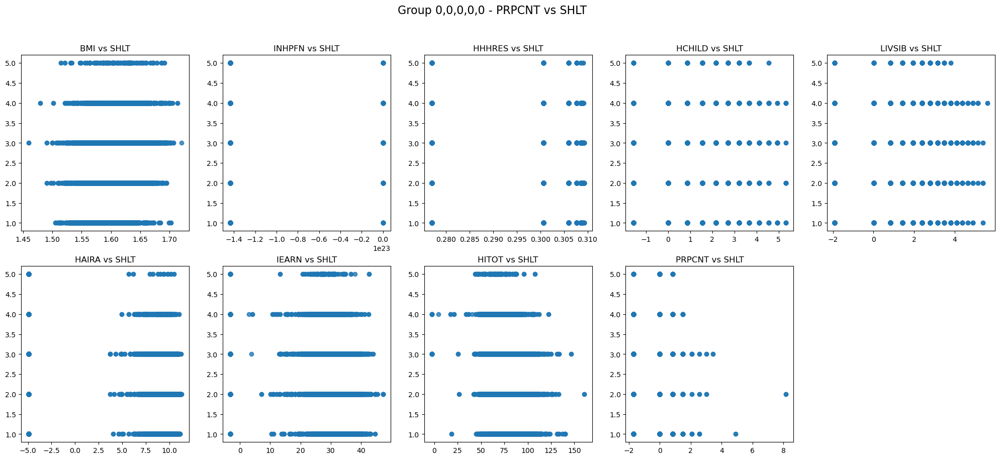

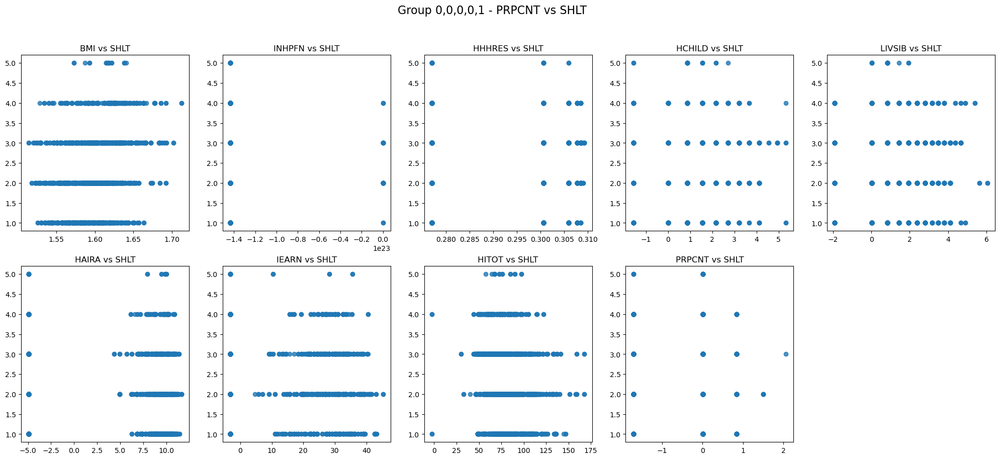

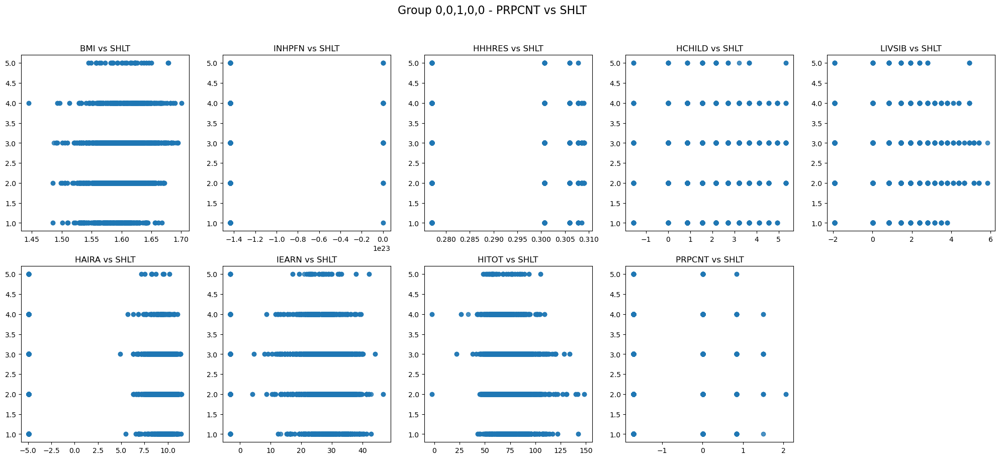

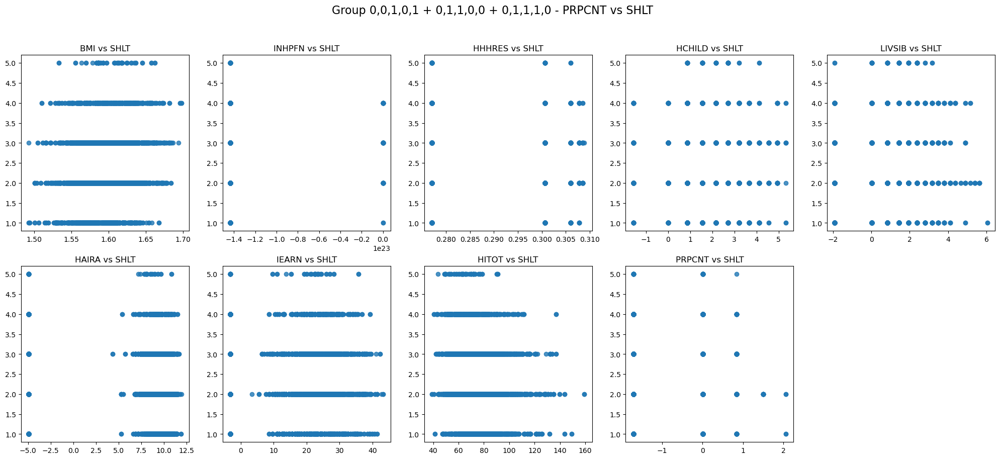

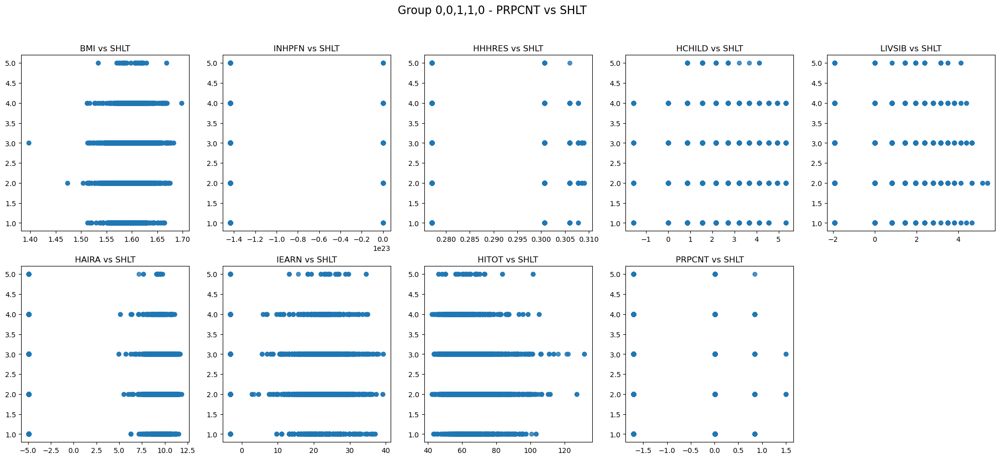

...

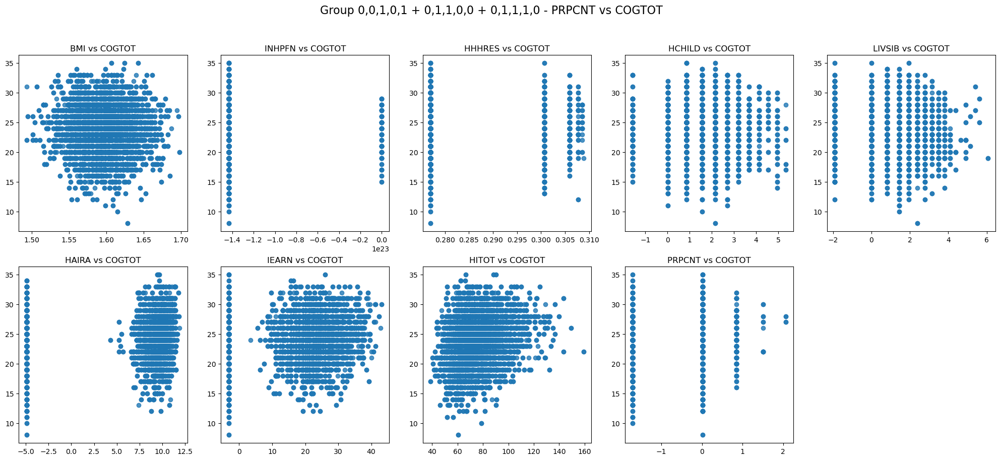

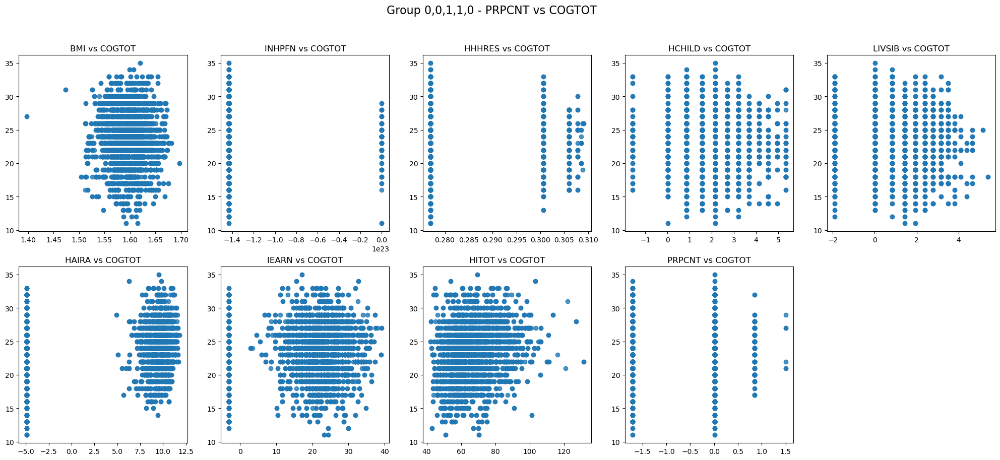

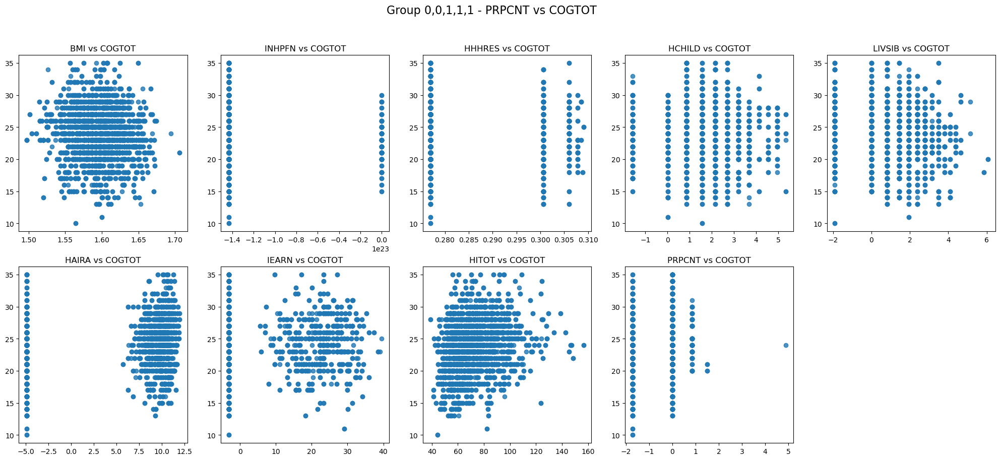

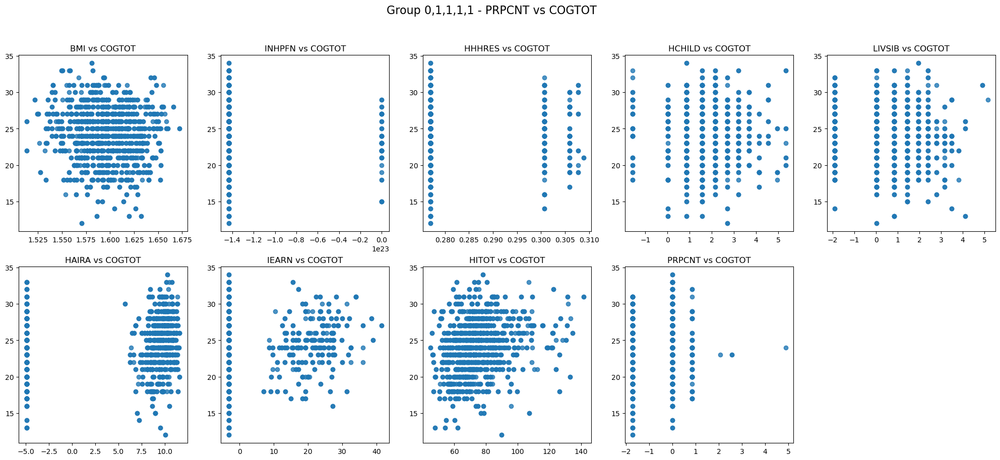

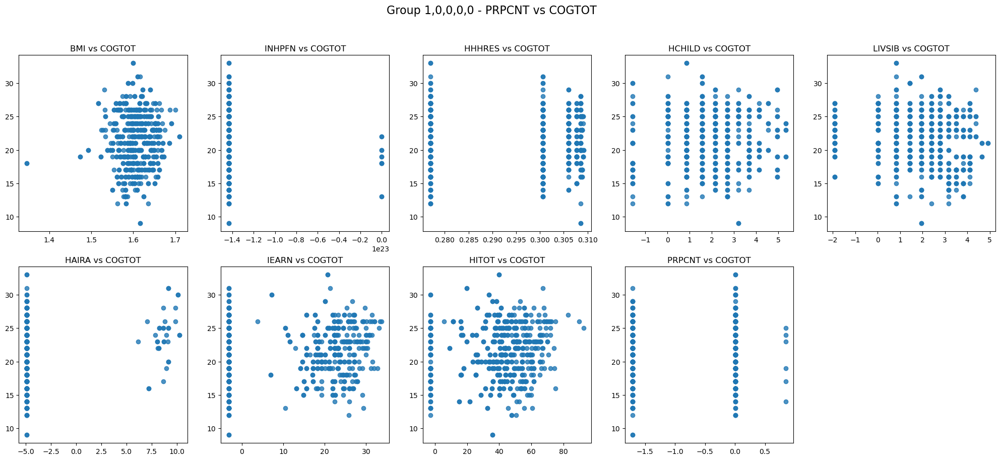

In [2]:
# Load the data
df = pd.read_csv("ThreeForthSemester_box_cox.csv")

continuous_features = ['BMI', 'INHPFN',  'HHHRES', 'HCHILD','LIVSIB',  'HAIRA', 'IEARN','HITOT', 'PRPCNT']
target = ["SHLT","MSTOT","COGTOT"]

# Unique groups
groups = df['group'].unique()  # Assuming 'group' is the correct column name

# Loop over each target and group and create scatter plots
for t in target:
    for group in groups:
        group_df = df[df['group'] == group]
        
        # Calculate the number of rows and columns needed for subplots
        num_features = len(continuous_features)
        num_cols = 5
        num_rows = (num_features + num_cols - 1) // num_cols  # Ceiling division to get enough subplots

        fig, ax = plt.subplots(num_rows, num_cols, figsize=(25, num_rows*5))  # Adjust the figure size as needed
        ax = ax.flatten()  # Flatten the ax array for easy iteration
        for i, feature in enumerate(continuous_features):
            ax[i].scatter(group_df[feature], group_df[t], alpha=0.8)
            ax[i].set_title(f"{feature} vs {t}")
            fig.suptitle(f"Group {group} - {feature} vs {t}", fontsize=16)

        # Hide any unused subplots
        for j in range(i + 1, num_rows*num_cols):
            ax[j].set_visible(False)
        plt.savefig('scatterplots_Input_vs_target_log_boxcox\Group ' + str(group) + ' ' + t + ' vs '+ "continuous_features")
        plt.show()

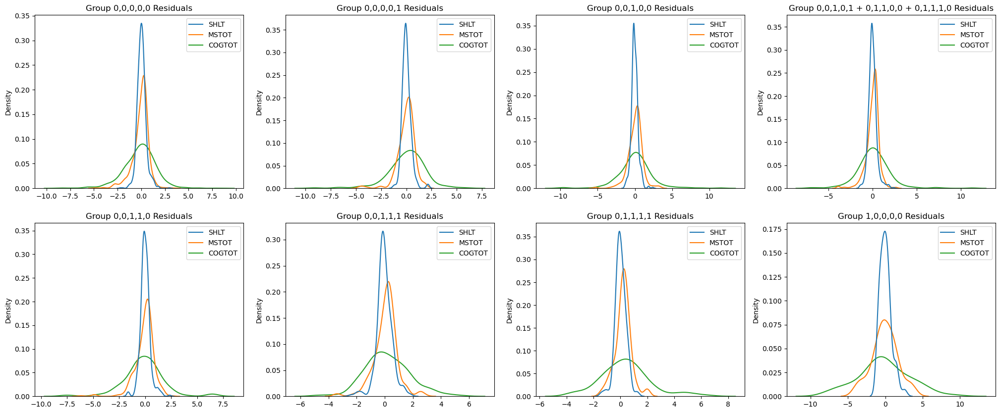

In [3]:
df = pd.read_csv("ThreeForthSemester_box_cox.csv")
target = ["SHLT","MSTOT","COGTOT"]

groups = df.group.unique()

fig, ax = plt.subplots(2,4, figsize=(25,10))
i = 0
for group in groups:
    rf = RandomForestRegressor(n_estimators=100, n_jobs=-1)
    group_df = df[df.group == group]
    X = group_df.drop(target+["group"], axis=1)
    y = group_df[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
    rf.fit(X_train, y_train)

    row = i // 4
    col = i % 4
    sns.kdeplot(y_test - rf.predict(X_test), ax=ax[row][col])
    ax[row][col].set_title("Group " + str(group) + " Residuals")
    i += 1
plt.show()

In [4]:
df = pd.read_csv("ThreeForthSemester_box_cox.csv")
groups = df['group'].unique()
feature_columns = ['BMI', 'INHPFN',  'HHHRES', 'HCHILD', 'LIVSIB',  'HAIRA', 'IEARN', 'HITOT', 'PRPCNT']
target_features = ['SHLT', 'COGTOT', 'MSTOT']

rf = RandomForestRegressor(random_state=42, n_jobs=-1)

param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                           scoring='r2',  # Use the R^2 score to evaluate the model
                           cv=10,
                           n_jobs=-1,
                           verbose=2)

In [5]:
train_by_group_results = []
residules = dict()
for group in groups:
    # Filter data for the current group
    group_data = df[df['group'] == group]
        
    # Split the group data into features and the current target
    X = group_data[feature_columns]
    y = group_data[target_features]
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
    
    
    # Perform GridSearchCV
    grid_search.fit(X_train, y_train)
    
    # Extract results
    best_params = grid_search.best_params_
    best_train_score = grid_search.best_score_
    best_test_score = grid_search.score(X_test, y_test) 
    
    # Make predictions
    y_train_pred = grid_search.best_estimator_.predict(X_train)
    y_test_pred = grid_search.best_estimator_.predict(X_test)

    residules[group] = {"error": y_test - y_test_pred, "y_test": y_test, "y_pred": y_test_pred,"x_test": X_test}

    # Calculate RMSE and MAPE for training data
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    mape_train = mean_absolute_percentage_error(y_train, y_train_pred)

    # Calculate RMSE and MAPE for testing data
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    mape_test = mean_absolute_percentage_error(y_test, y_test_pred)
    
    # Store results
    train_by_group_results.append({
        'Group': group,
        'Best Parameters': str(best_params),  # Convert dict to string for easier CSV writing
        'Train R^2 (avg)': best_train_score,
        'Test R^2 (avg)': best_test_score,
        'Train RMSE': rmse_train,
        'Test RMSE': rmse_test,
        'Train MAPE': mape_train,
        'Test MAPE': mape_test
    })

# Convert results to DataFrame
train_by_group_results_df = pd.DataFrame(train_by_group_results)
train_by_group_results_df

KeyError: "['HATOTB'] not in index"

In [ ]:
residules["0,0,0,0,0"]["error"]

NameError: name 'residules' is not defined

NameError: name 'residules' is not defined

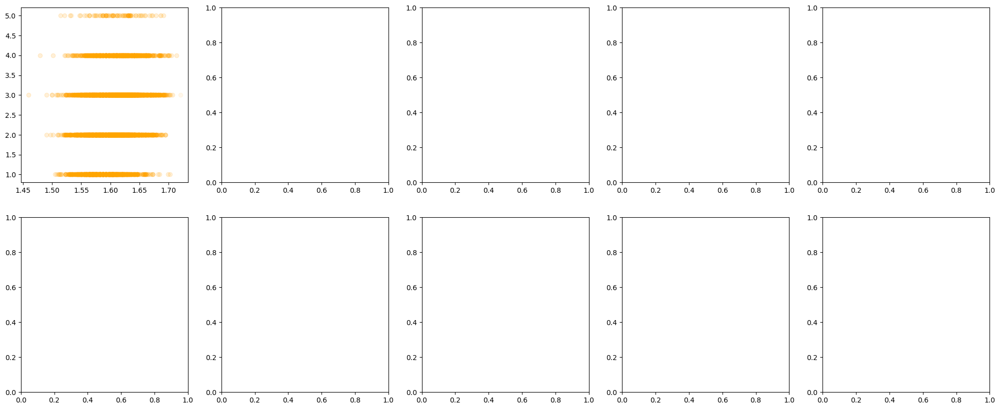

In [ ]:
feature_columns = ['BMI', 'INHPFN',  'HHHRES', 'HCHILD', 'LIVSIB',  'HAIRA', 'IEARN', 'HITOT', 'PRPCNT']
target_features = ['SHLT', 'COGTOT', 'MSTOT']

for t in range(3):
    target = target_features[t]
    for group in groups:
        group_df = df[df.group == group]
        fig, ax = plt.subplots(2,5, figsize=(25,10))
        i = 0
        for row in range(2):
            for col in range(5):
                ax[row][col].scatter(group_df[feature_columns[i]], group_df[target_features[t]], alpha = 0.08, color = "orange", label = "True Value")
                x = residules[group]["x_test"][feature_columns[i]]
                y = residules[group]["y_pred"][:,t]
                ax[row][col].scatter(x, y, alpha = 0.1, label = "Predicted Value")
                ax[row][col].set_title(feature_columns[i]+ " vs "+ target)
                ax[row][col].set_xlabel("Feature " + feature_columns[i])
                ax[row][col].set_ylabel("y_pred")
                fig.suptitle('Group ' + str(group) + ' ' + target + ' vs '+ "y_Prediction", fontsize=16)
                i += 1
        plt.savefig('scatterplot_input_vs_pred_boxcox\Group ' + str(group) + ' ' + target + ' vs '+ "y_Prediction")
        plt.show()

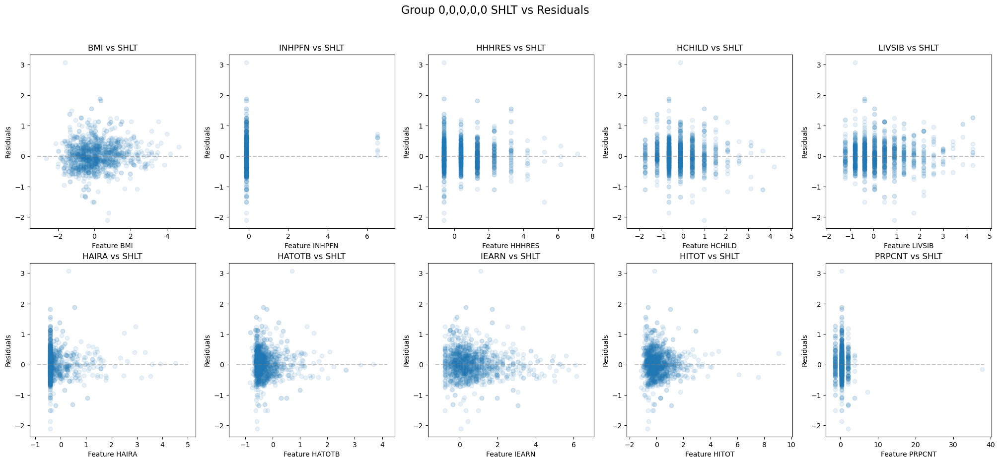

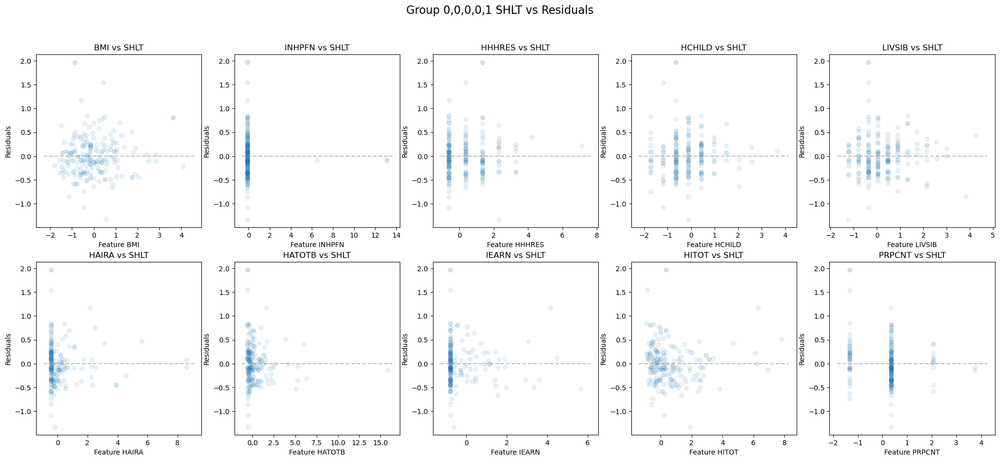

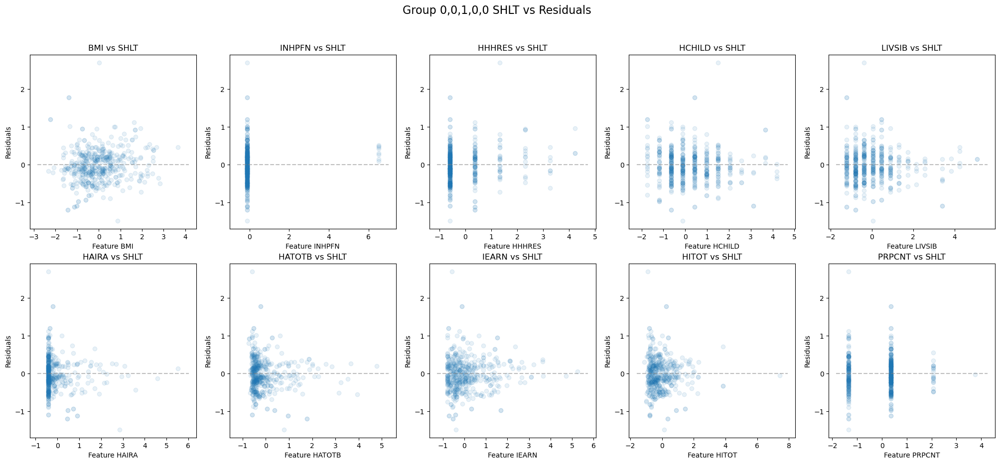

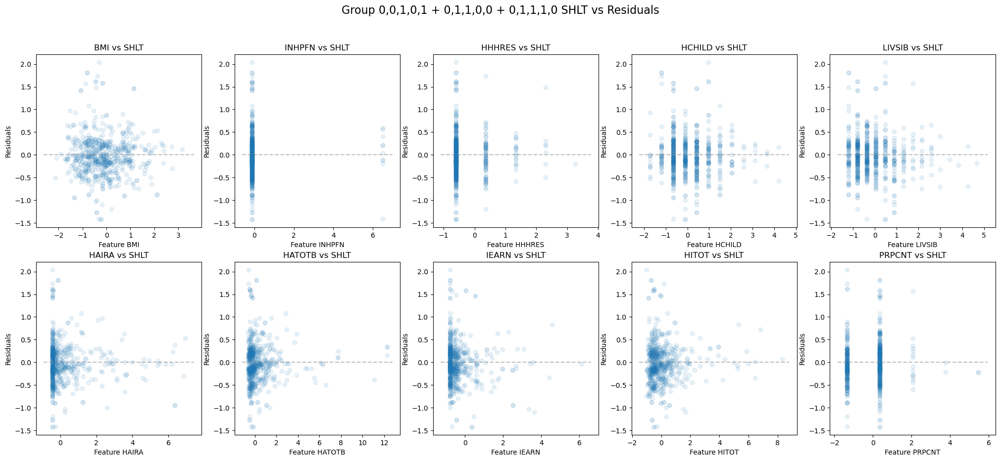

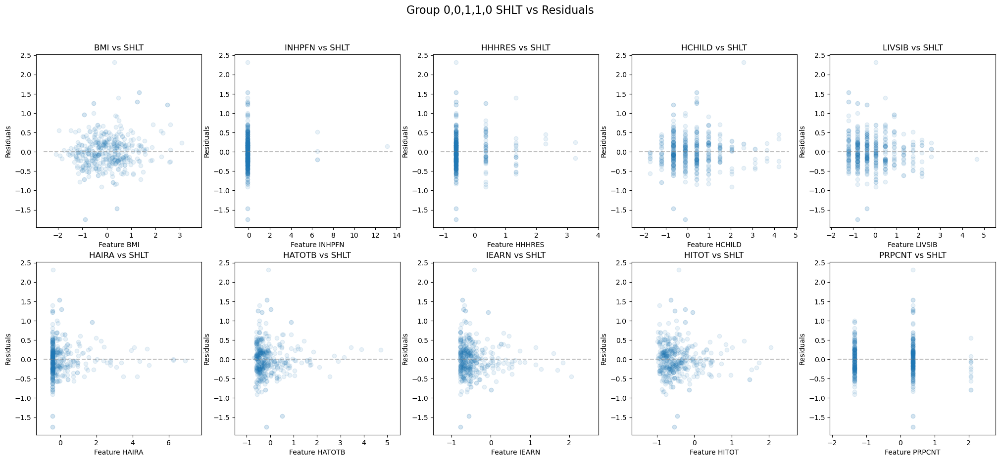

...

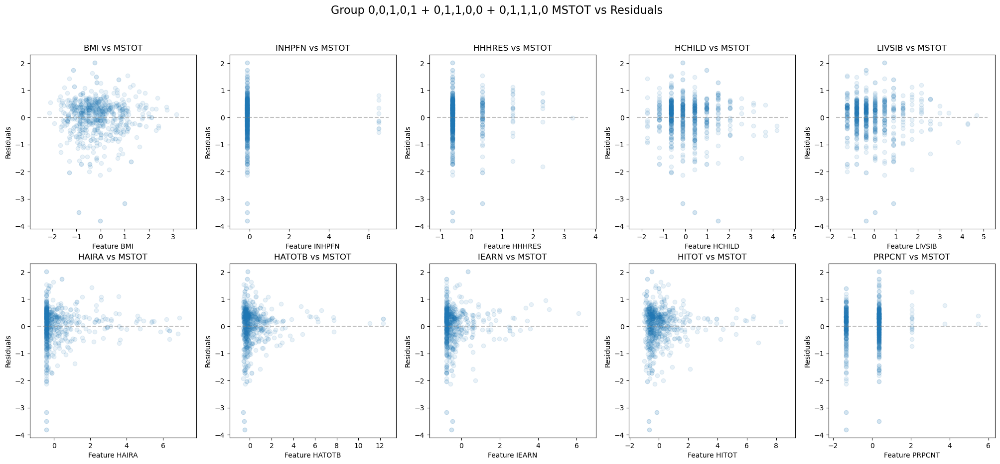

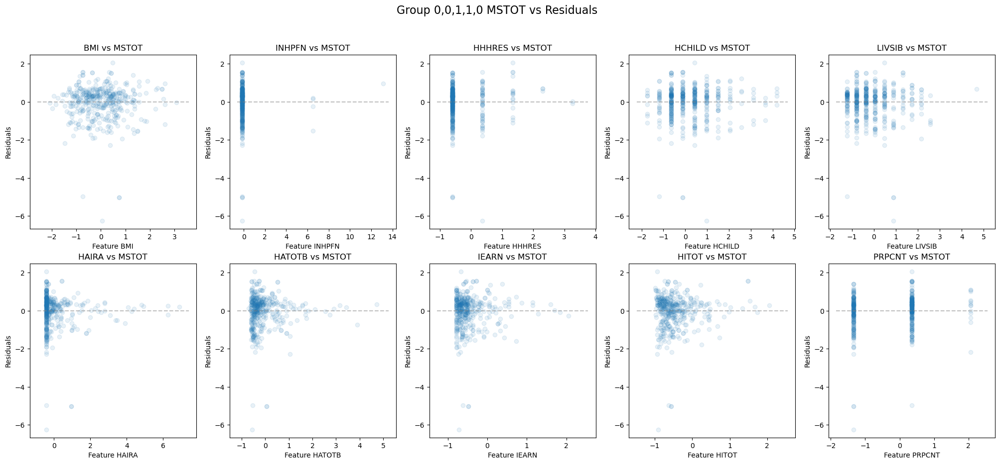

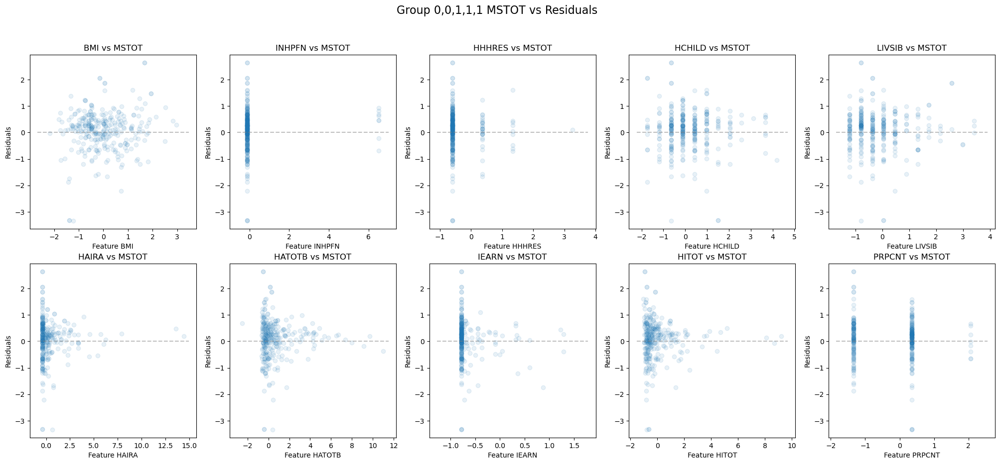

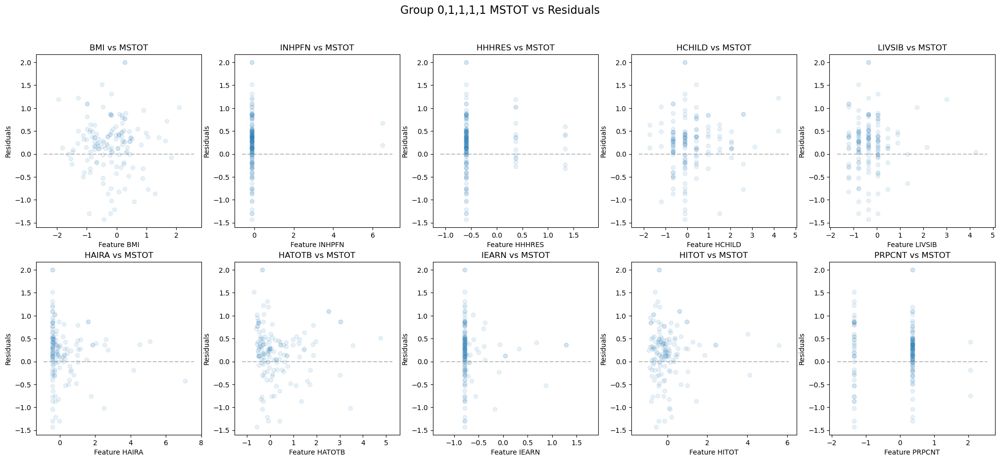

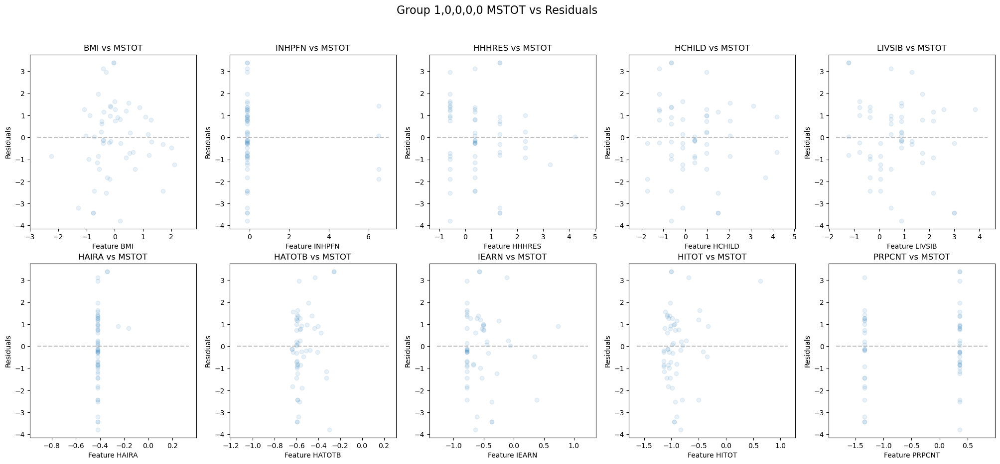

In [ ]:
for t in range(3):
    target = target_features[t]
    for group in groups:
        fig, ax = plt.subplots(2,5, figsize=(25,10))
        i = 0
        for row in range(2):
            for col in range(5):
                x = residules[group]["x_test"][feature_columns[i]]
                y = residules[group]["error"].values[:,t]
                ax[row][col].hlines(0, x.min()-0.5, x.max()+0.5, color='gray', alpha = 0.5, linestyle='--')
                ax[row][col].scatter(x, y, alpha = 0.1)
                ax[row][col].set_title(feature_columns[i]+ " vs "+ target)
                ax[row][col].set_xlabel("Feature " + feature_columns[i])
                ax[row][col].set_ylabel("Residuals")
                fig.suptitle('Group ' + str(group) + ' ' + target + ' vs '+ "Residuals", fontsize=16)
                i += 1
        plt.savefig('scatterplot_input_vs_residuals_boxcox\Group ' + str(group) + ' ' + target + ' vs '+ "Residuals")
        plt.show()

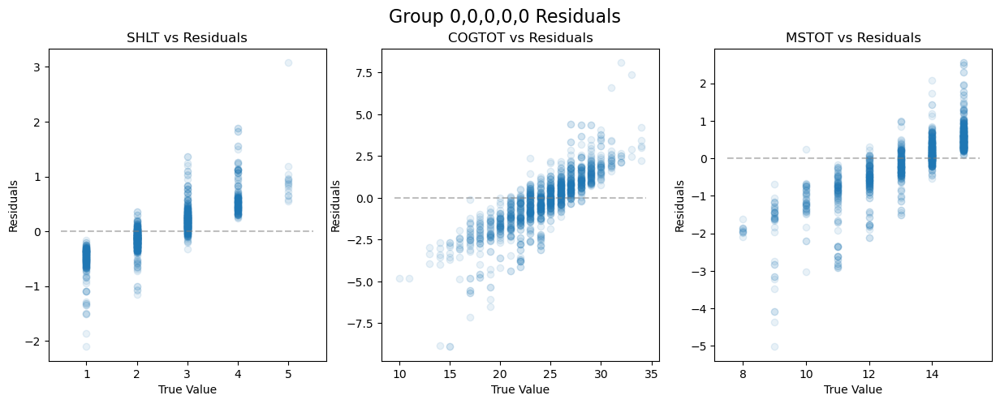

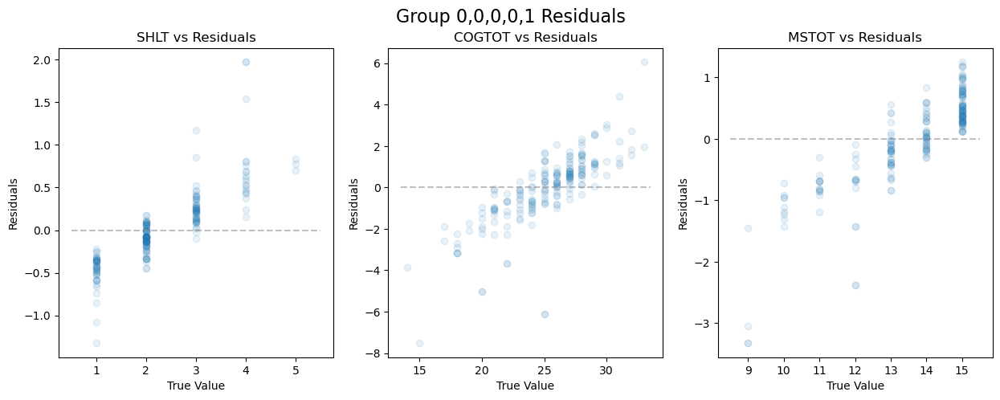

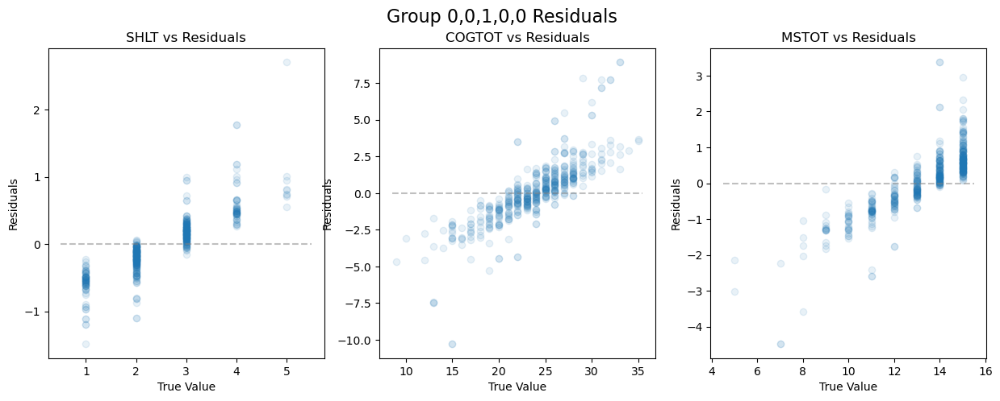

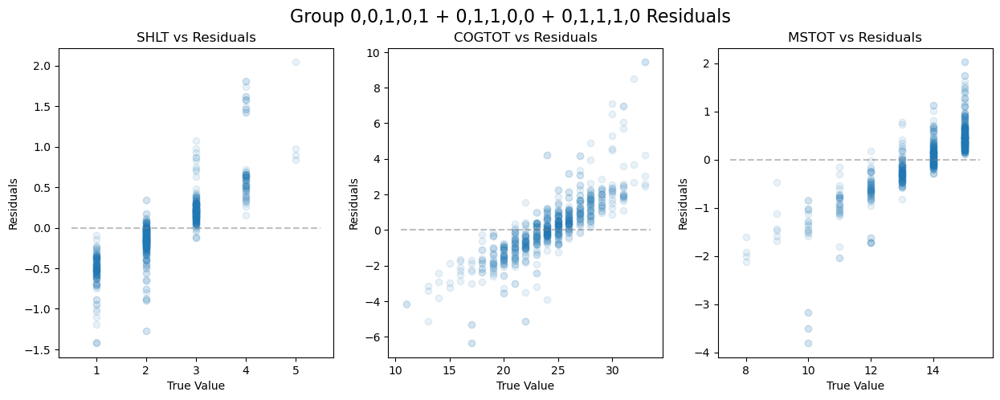

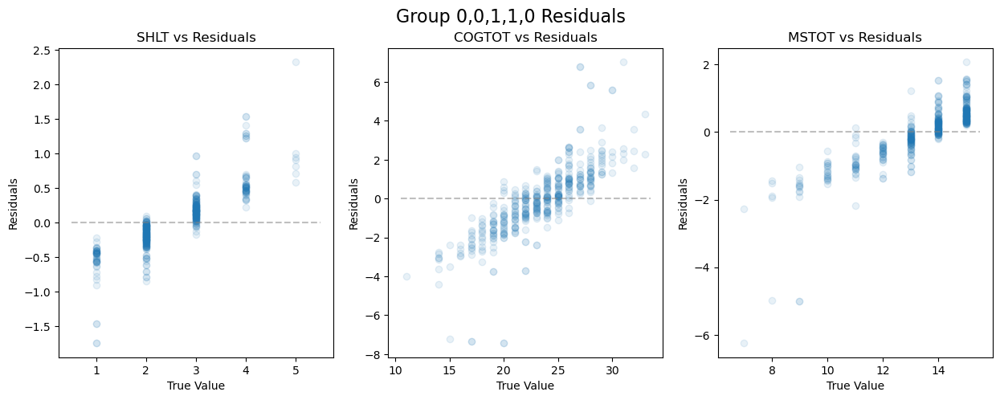

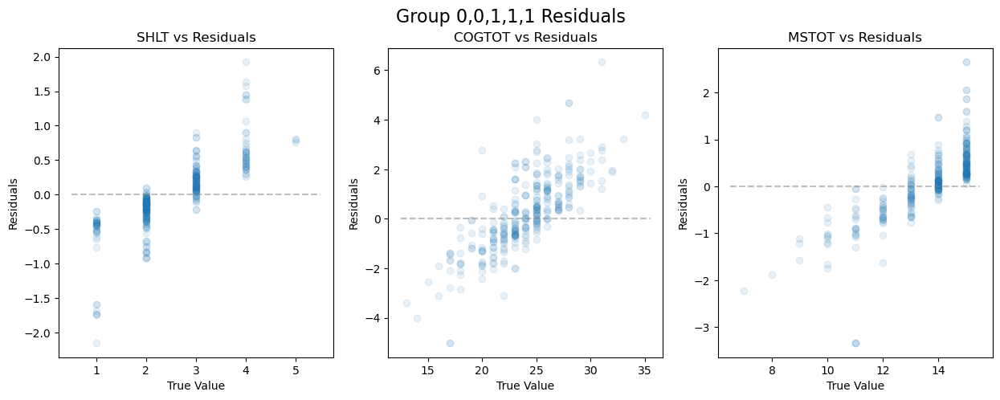

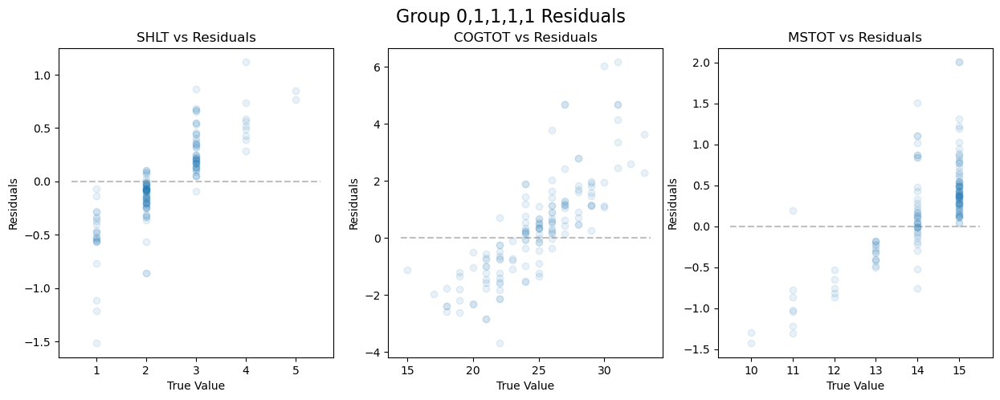

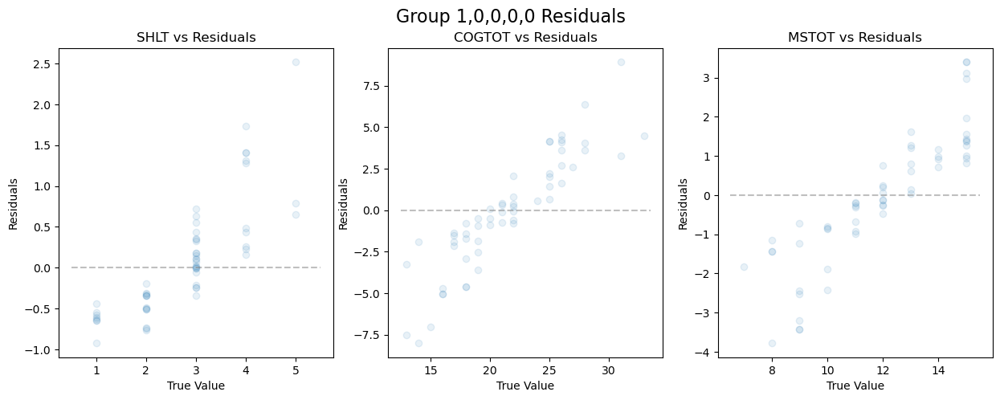

In [ ]:
for group in groups:
    fig, ax = plt.subplots(ncols = 3, figsize=(15,5))
    for t in range(3):
        target = target_features[t]
        y = residules[group]["error"].values[:,t]
        x = residules[group]["y_test"][target]
        ax[t].scatter(x, y, alpha = 0.1)
        ax[t].hlines(0, x.min()-0.5, x.max()+0.5, color='gray', alpha = 0.5, linestyle='--')
        ax[t].set_title(target + " vs Residuals")
        ax[t].set_xlabel("True Value")
        ax[t].set_ylabel("Residuals")
    fig.suptitle('Group ' + str(group) + ' ' + "Residuals", fontsize=16)
    plt.savefig('scatterplot_target_vs_residuals_boxcox\Group ' + str(group) + ' ' + "Residuals")
    plt.show()

In [ ]:
def rf_cross_validation(train_data_x, train_data_y, n_estimators, max_depth, min_samples_split, min_samples_leaf):
    rf = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth, min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf, random_state=42, n_jobs=-1)

    # Initialize KFold
    kf = KFold(n_splits=10, shuffle=True, random_state=42)

    # Store the split indices for each group
    group_folds = {group: [] for group in groups}
    for group in groups:
        group_data = df[df['group'] == group]
        X_group = group_data[feature_columns]
        y_group = group_data[target_features]
        for train_index, test_index in kf.split(X_group):
            group_folds[group].append((train_index, test_index))

    # Custom cross-validation and evaluation
    results = []
    for fold_index in range(10):  # Assuming 10-fold CV
        X_train_list, X_test_list, y_train_list, y_test_list = [], [], [], []

        for group in groups:
            # Get the training and testing indices for this fold and group
            train_indices, test_indices = group_folds[group][fold_index]
            group_data = df[df['group'] == group]

            # Split the data
            X_train_list.append(group_data.iloc[train_indices][feature_columns])
            y_train_list.append(group_data.iloc[train_indices][target_features])
            X_test_list.append(group_data.iloc[test_indices][feature_columns])
            y_test_list.append(group_data.iloc[test_indices][target_features])
        
        # Combine the training and testing data for this fold
        X_train = pd.concat(X_train_list)
        y_train = pd.concat(y_train_list)
        X_test = pd.concat(X_test_list)
        y_test = pd.concat(y_test_list)

        # Fit the model
        rf.fit(X_train, y_train)
        pred = rf.predict(X_test)
        score = mean_absolute_percentage_error(y_test, pred)

        # Collecting the evaluation metric for each fold
        results.append(score)
    return np.mean(results)



In [ ]:
# Initialize KFold
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Store the split indices for each group
group_folds = {group: [] for group in groups}
group_test = {group: [] for group in groups}
for group in groups:
    group_data = df[df['group'] == group]
    X = group_data[feature_columns]
    y = group_data[target_features]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
    group_test[group] = (X_test, y_test)

    X_group = X_train
    y_group = y_train
    for train_index, test_index in kf.split(X_group):
        group_folds[group].append((train_index, test_index))

# Custom cross-validation and evaluation

X_train_list, X_test_list, y_train_list, y_test_list = [], [], [], []

for group in groups:
    # Get the training and testing indices for this fold and group
    train_indices, test_indices = group_folds[group][0]
    group_data = df[df['group'] == group]

    # Split the data
    X_train_list.append(group_data.iloc[train_indices][feature_columns])
    y_train_list.append(group_data.iloc[train_indices][target_features])
    X_test_list.append(group_data.iloc[test_indices][feature_columns])
    y_test_list.append(group_data.iloc[test_indices][target_features])

# Combine the training and testing data for this fold
X_train = pd.concat(X_train_list)
y_train = pd.concat(y_train_list)
X_test = pd.concat(X_test_list)
y_test = pd.concat(y_test_list)


In [ ]:
best_param = dict()
best_mse = 1000000000
for a in param_grid["n_estimators"]:
    for b in param_grid["max_depth"]:
        for c in param_grid["min_samples_split"]:
            for d in param_grid["min_samples_leaf"]:
                score = rf_cross_validation(X_train,y_train, n_estimators=a, max_depth=b, min_samples_split=c, min_samples_leaf=d)
                if score < best_mse:
                    best_mse = score
                    best_param = {'n_estimators': a, 'max_depth': b, 'min_samples_split': c, 'min_samples_leaf': d}
print(best_param, best_mse)

{'n_estimators': 300, 'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 1} 0.09348203969663026


In [ ]:
rf = RandomForestRegressor( random_state=42, n_jobs=-1, n_estimators=best_param['n_estimators'], max_depth=best_param['max_depth'], min_samples_split=best_param['min_samples_split'], min_samples_leaf=best_param['min_samples_leaf'])

train_by_AllGroup_results = []
for group in groups:
    X = group_test[group][0]
    y = group_test[group][1]
    rf.fit(X, y)
    y_pred = rf.predict(X)

    best_test_score = rf.score(X, y) 

    rmse_test = np.sqrt(mean_squared_error(y, y_pred))

    mape_test = mean_absolute_percentage_error(y, y_pred)


    train_by_AllGroup_results.append({
        'Group': group,
        'Test R^2 (avg)': best_test_score,
        'Test RMSE': rmse_test,
        'Test MAPE': mape_test
    })

train_by_AllGroup_results_df = pd.DataFrame(train_by_AllGroup_results)
train_by_AllGroup_results_df

,Group,Test R^2 (avg),Test RMSE,Test MAPE
0,"0,0,0,0,0",0.884953,0.842151,0.073548
1,"0,0,0,0,1",0.879472,0.780059,0.073848
2,"0,0,1,0,0",0.874236,1.002350,0.078087
3,"0,0,1,0,1 + 0,1,1,0,0 + 0,1,1,1,0",0.879559,0.829508,0.071919
4,"0,0,1,1,0",0.873881,0.893280,0.070803
5,"0,0,1,1,1",0.877034,0.805485,0.069275
6,"0,1,1,1,1",0.863825,0.794377,0.069442
7,"1,0,0,0,0",0.856452,1.206120,0.098564
